In [2]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [3]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his/')

In [4]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_3chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_dreamzs_3chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_3chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_dreamzs_3chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-2321.73702616]
 [-2321.73702616]
 [-2239.4448323 ]
 ..., 
 [  104.96117595]
 [  104.96117595]
 [  104.96117595]]
Logp of trace:  a  chain:  1  =  [ 106.32615655]
Logp of trace:  a  chain:  2  =  [ 106.53698567]
Logp of trace:  b  chain: 0 =  [[-2250.95673437]
 [-2250.95673437]
 [-2250.95673437]
 ..., 
 [  104.93684105]
 [  104.93684105]
 [  104.93684105]]
Logp of trace:  b  chain:  1  =  [ 106.02157007]
Logp of trace:  b  chain:  2  =  [ 105.54833423]
Logp of trace:  c  chain: 0 =  [[-2650.00450274]
 [-2596.01572845]
 [-2596.01572845]
 ..., 
 [  106.17546991]
 [  106.17546991]
 [  106.17546991]]
Logp of trace:  c  chain:  1  =  [ 106.00141656]
Logp of trace:  c  chain:  2  =  [ 106.68325962]
Logp of trace:  d  chain: 0 =  [[-2452.66601209]
 [-2452.66601209]
 [-2011.31476584]
 ..., 
 [  107.68064499]
 [  107.68064499]
 [  107.68064499]]
Logp of trace:  d  chain:  1  =  [ 105.64855778]
Logp of trace:  d  chain:  2  =  [ 102.38020537]


In [6]:
traces['a'][0][:,72]

array([-1.21335155, -1.21335155, -1.18516836, ...,  0.09790599,
        0.09790599,  0.09790599])

In [7]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [8]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  75  of  105  parameters.
Percent of parameters with GR below 1.2:  71.4285714286
Number of parameters with GR below 1.1:  46  of  105  parameters.
Percent of parameters with GR below 1.1:  43.8095238095


[75, 71.42857142857143, 46, 43.80952380952381]

In [9]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  65  of  105  parameters.
Percent of parameters with GR below 1.2:  61.9047619048
Number of parameters with GR below 1.1:  39  of  105  parameters.
Percent of parameters with GR below 1.1:  37.1428571429


[65, 61.904761904761905, 39, 37.142857142857146]

In [10]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  64  of  105  parameters.
Percent of parameters with GR below 1.2:  60.9523809524
Number of parameters with GR below 1.1:  41  of  105  parameters.
Percent of parameters with GR below 1.1:  39.0476190476


[64, 60.952380952380956, 41, 39.04761904761905]

In [11]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  58  of  105  parameters.
Percent of parameters with GR below 1.2:  55.2380952381
Number of parameters with GR below 1.1:  34  of  105  parameters.
Percent of parameters with GR below 1.1:  32.380952381


[58, 55.23809523809524, 34, 32.38095238095238]

50000
3
50000


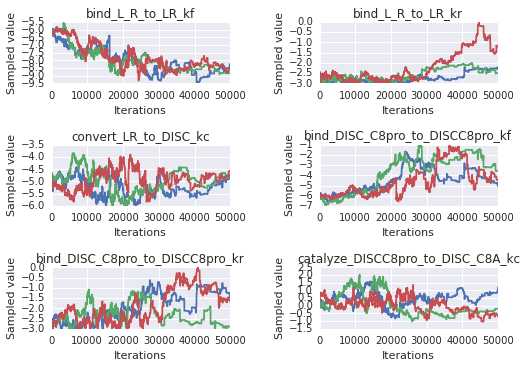

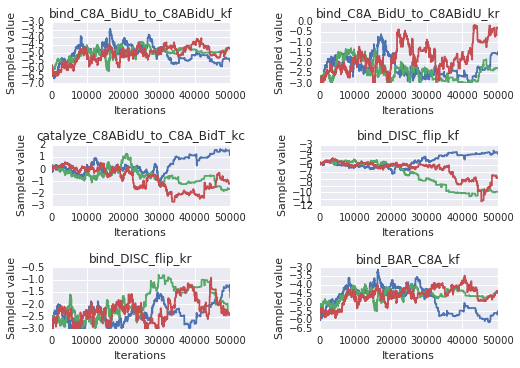

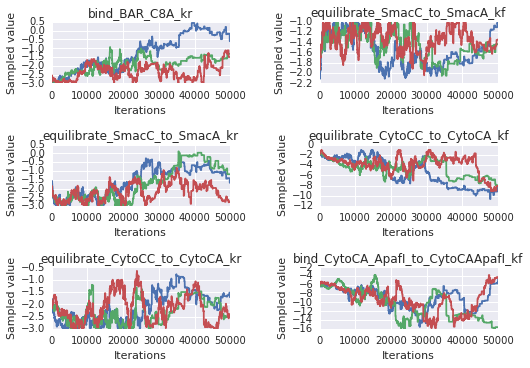

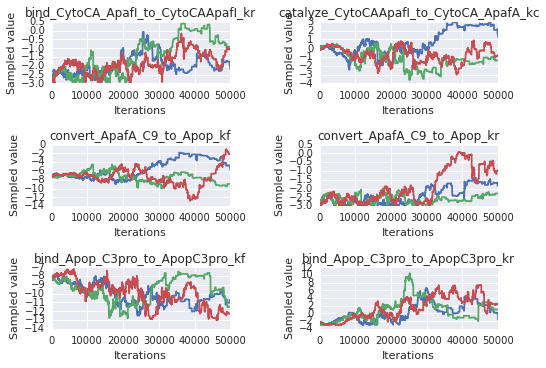

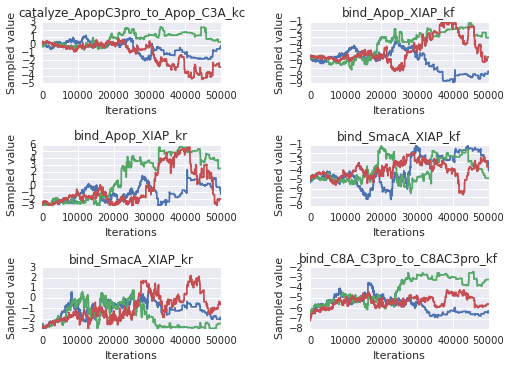

...

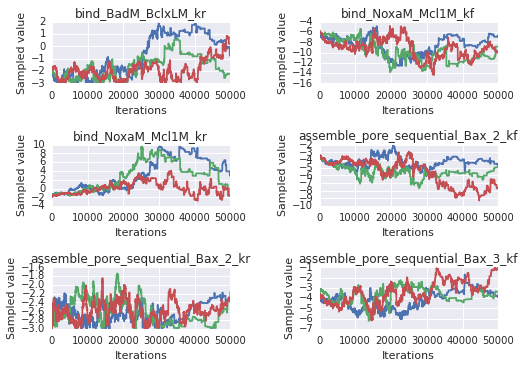

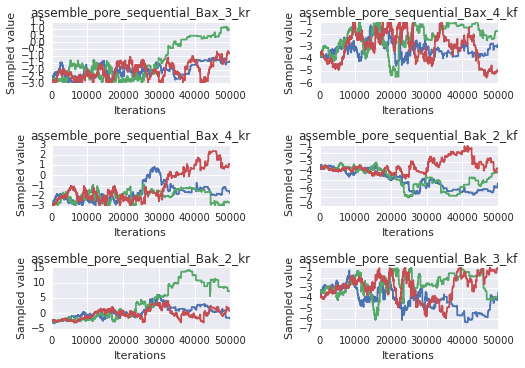

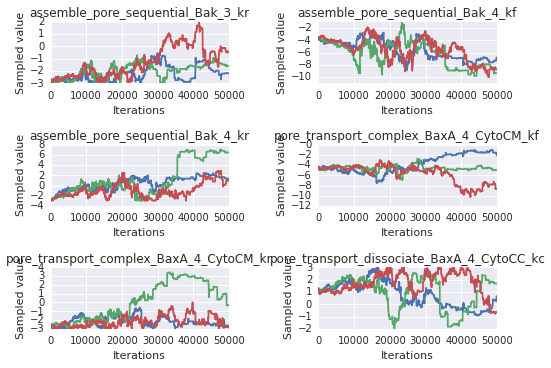

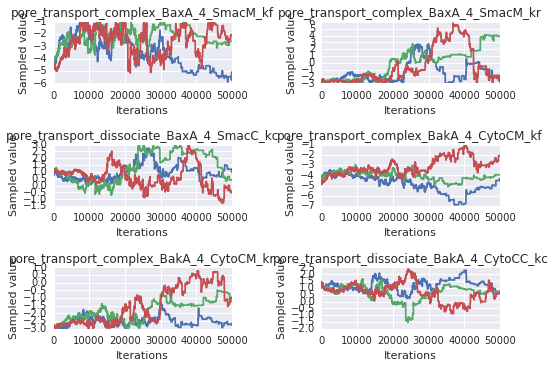

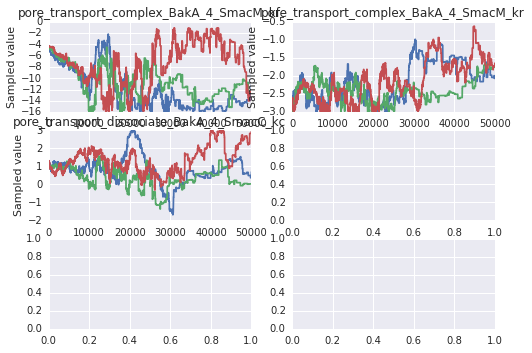

In [12]:
sample_plots(param_trace_dicts['a'])

In [13]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=10000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=10000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=10000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=10000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


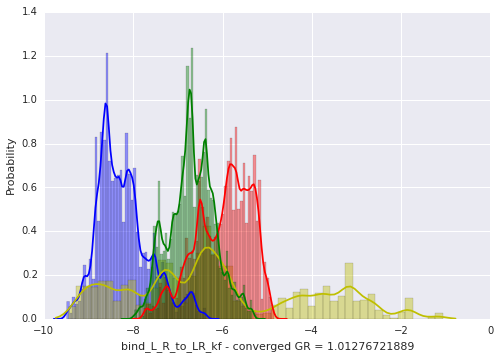

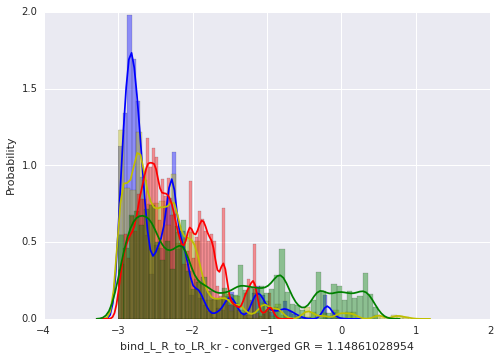

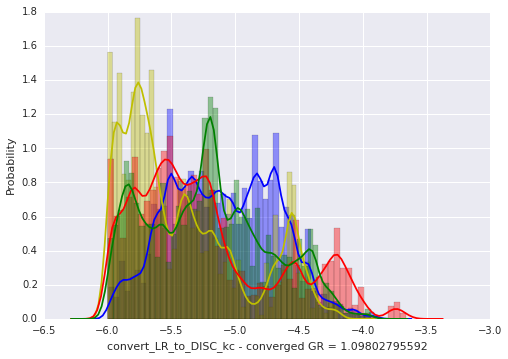

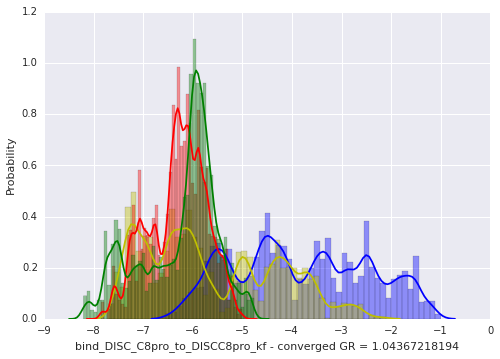

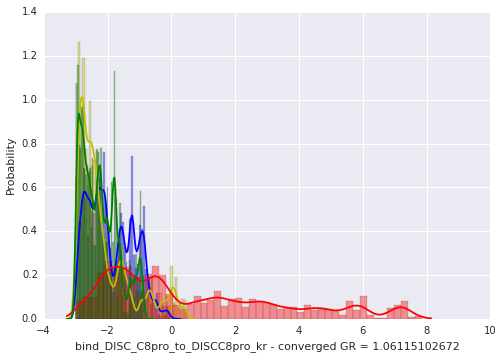

...

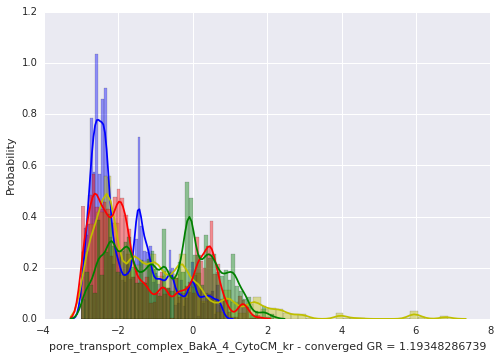

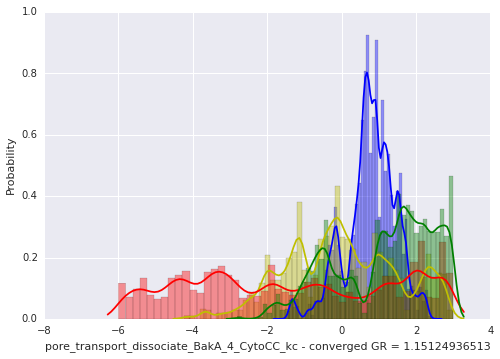

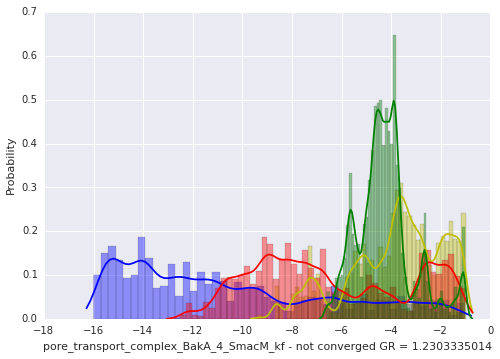

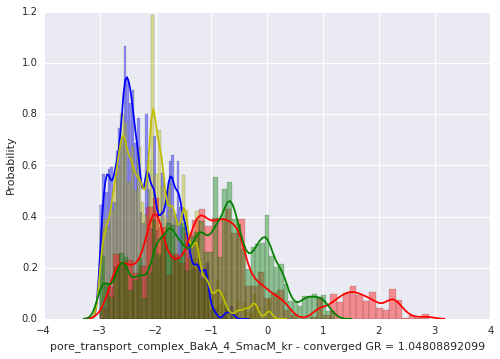

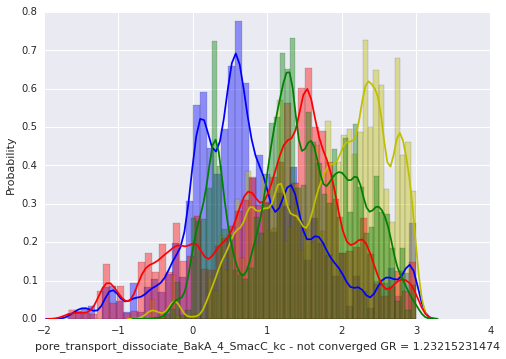

In [14]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [15]:
traces['a'][1][:,0]

array([-6.25186607, -6.23255075, -6.23255075, ..., -8.84192634,
       -8.84192634, -8.84192634])

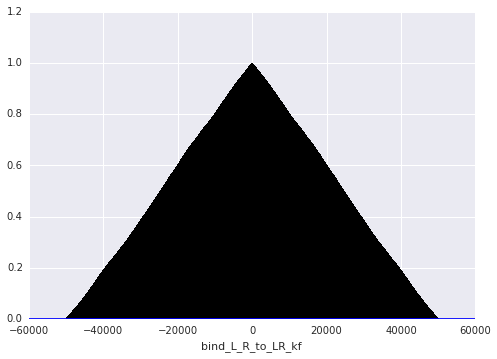

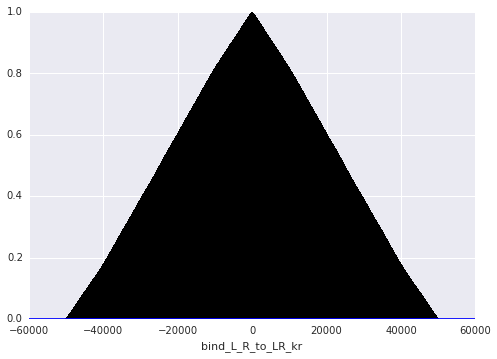

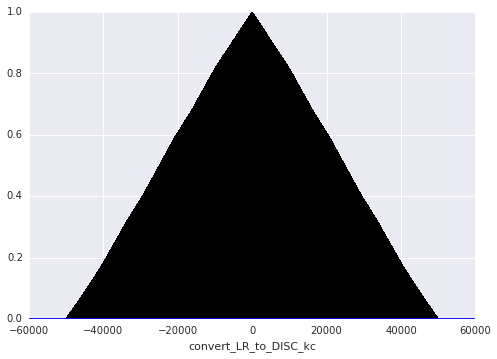

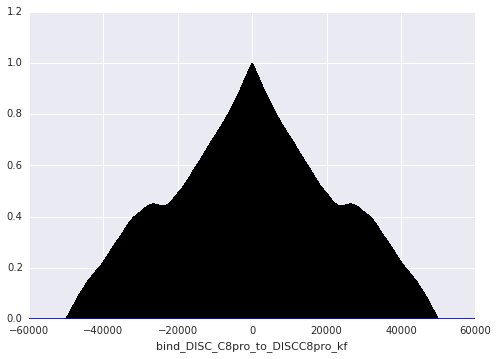

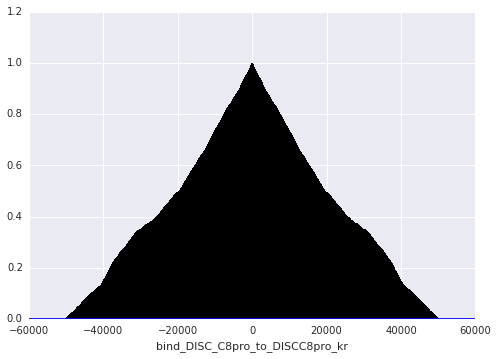

...

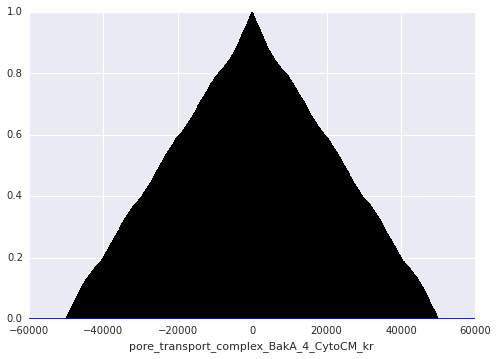

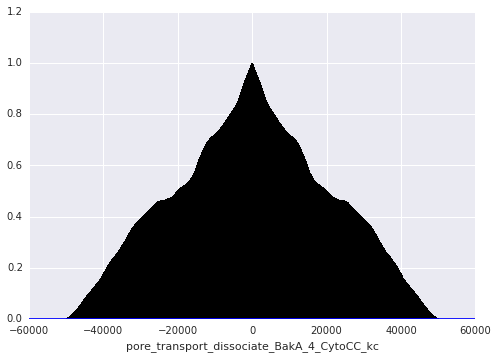

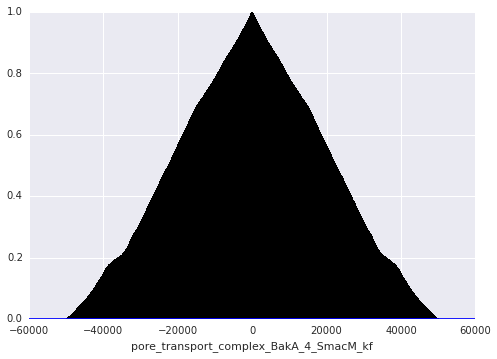

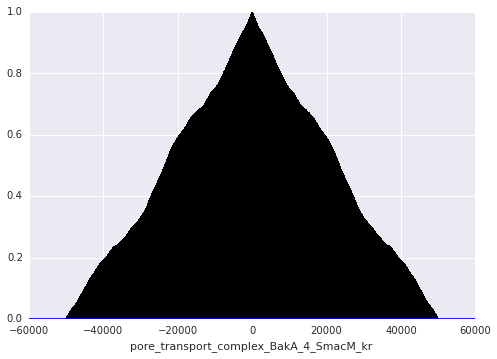

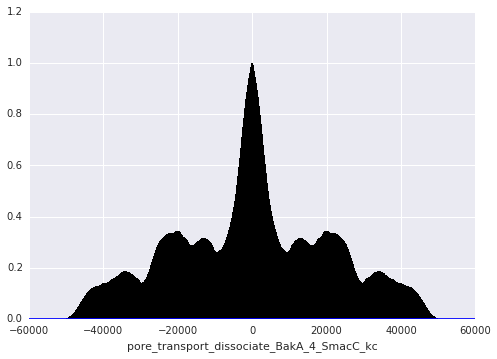

In [20]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

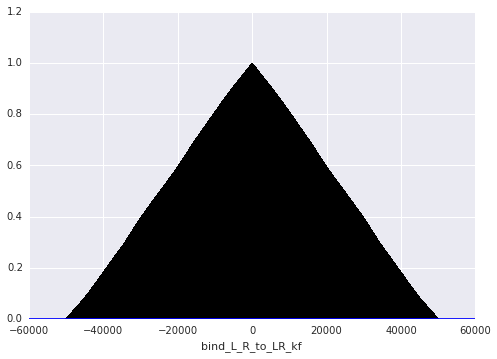

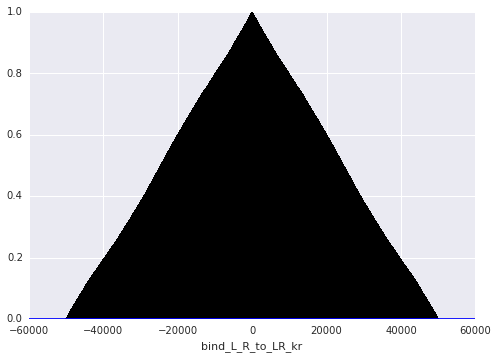

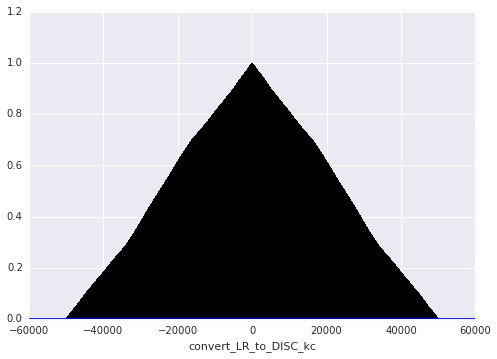

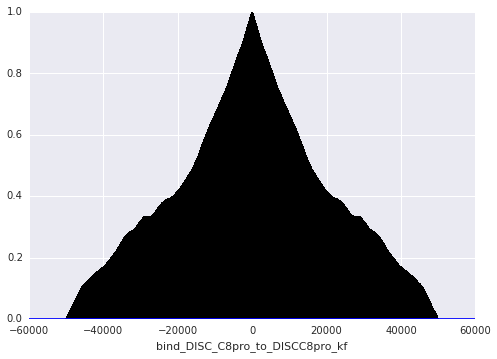

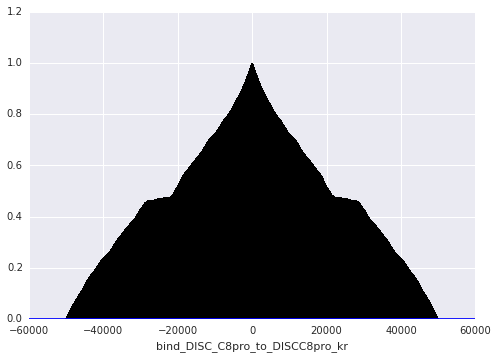

...

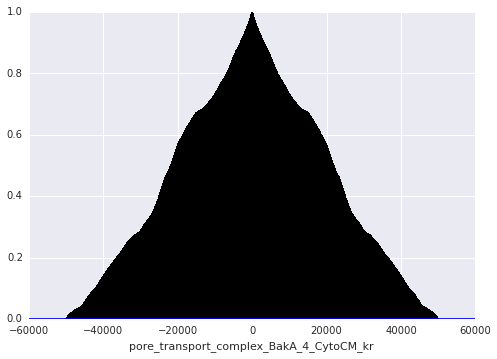

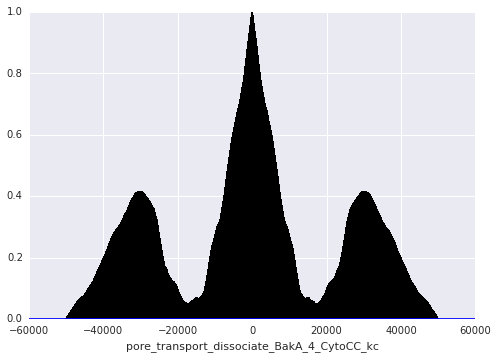

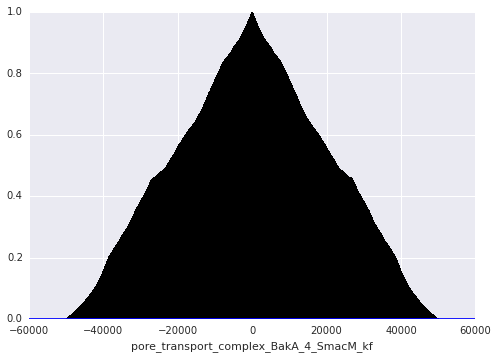

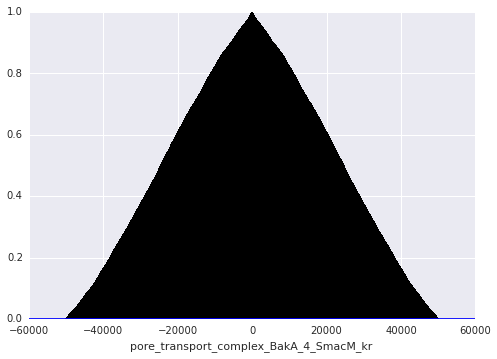

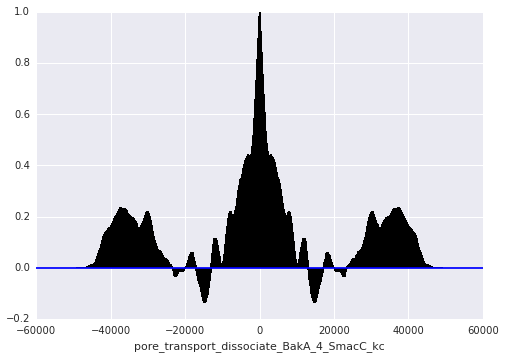

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

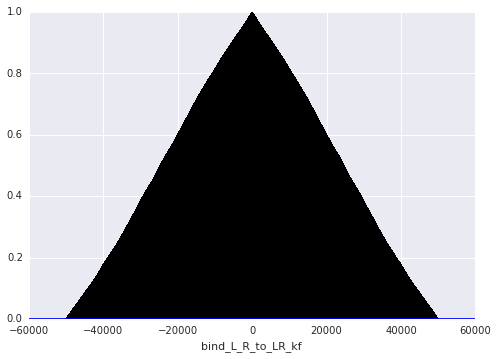

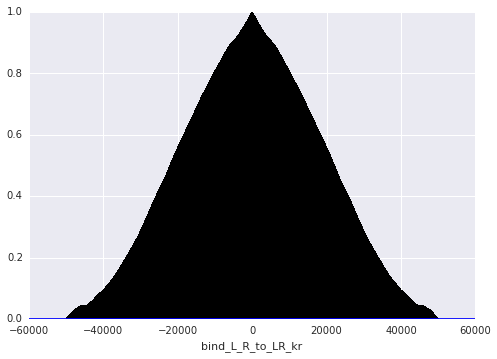

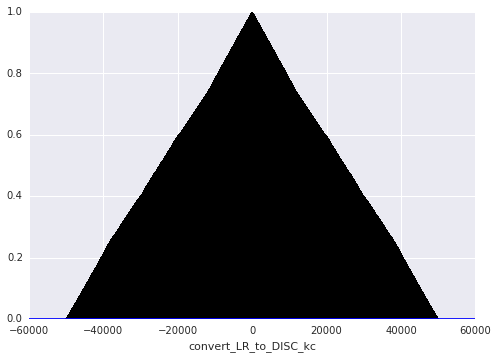

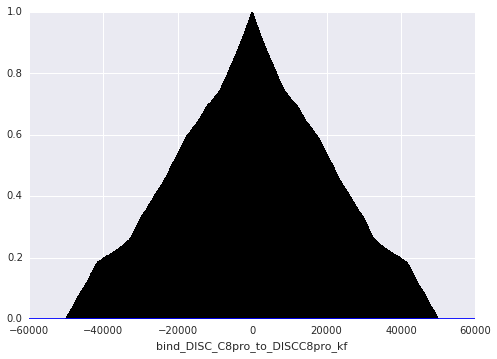

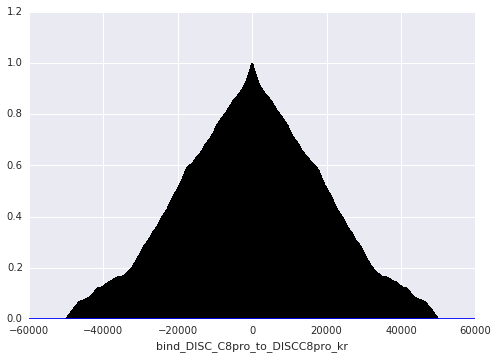

...

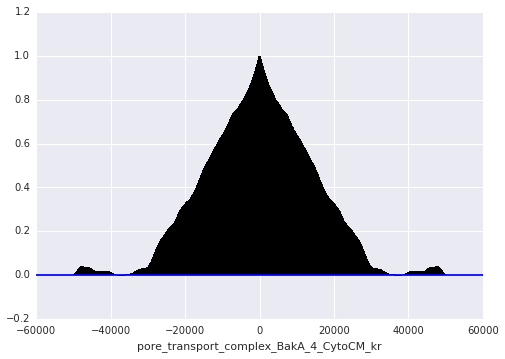

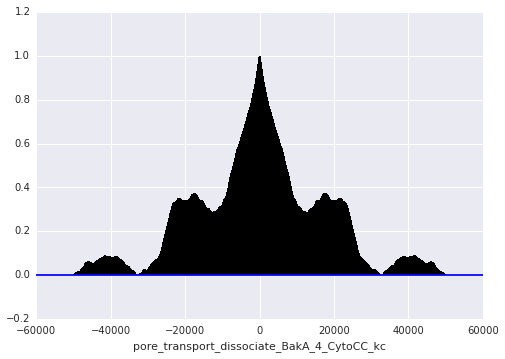

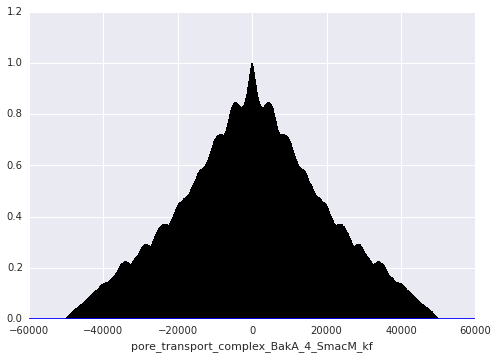

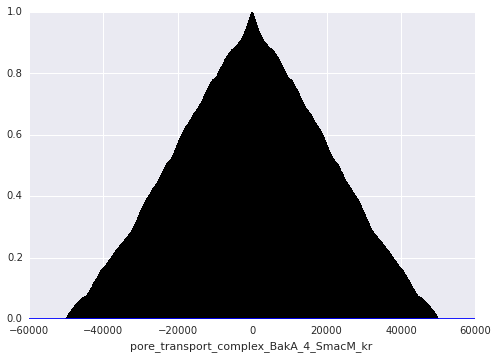

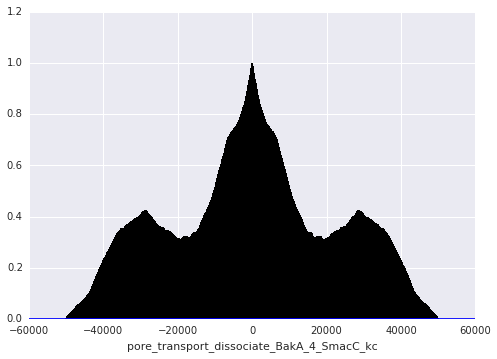

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [16]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1177  acceptance rate:  0.02354
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1231  acceptance rate:  0.02462
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1174  acceptance rate:  0.02348
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1174  acceptance rate:  0.02348
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1254  acceptance rate:  0.02508
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1244  acceptance rate:  0.02488
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1215  acceptance rate:  0.0243
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1265  acceptance rate:  0.0253
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1262  acceptance rate:  0.02524
N acceptances for parameter:  bind_DISC_flip_kf  =  1233  acceptance rate:  0.02466
N acceptances for parameter:  bind_DISC_flip_kr  =  1269  acceptance rate:  0.02

array([ 0.02354,  0.02462,  0.02348,  0.02348,  0.02508,  0.02488,
        0.0243 ,  0.0253 ,  0.02524,  0.02466,  0.02538,  0.0234 ,
        0.02526,  0.02548,  0.02558,  0.02524,  0.02508,  0.02522,
        0.0253 ,  0.0248 ,  0.02482,  0.02522,  0.02486,  0.02544,
        0.02526,  0.02528,  0.0254 ,  0.02534,  0.02504,  0.02394,
        0.02544,  0.02532,  0.02456,  0.02514,  0.02536,  0.02522,
        0.02538,  0.02474,  0.02536,  0.02512,  0.02542,  0.0247 ,
        0.02518,  0.02492,  0.0249 ,  0.02528,  0.02498,  0.02558,
        0.02502,  0.02462,  0.02532,  0.02454,  0.02504,  0.0254 ,
        0.02496,  0.02524,  0.0249 ,  0.0244 ,  0.02556,  0.02524,
        0.02526,  0.02534,  0.0251 ,  0.02496,  0.02534,  0.02526,
        0.02514,  0.02518,  0.0253 ,  0.0248 ,  0.02496,  0.02568,
        0.02536,  0.02546,  0.02508,  0.02554,  0.02514,  0.02578,
        0.02568,  0.0255 ,  0.02524,  0.0256 ,  0.02554,  0.02478,
        0.0247 ,  0.0253 ,  0.02488,  0.02556,  0.02504,  0.02

In [17]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1112  acceptance rate:  0.02224
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1212  acceptance rate:  0.02424
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1099  acceptance rate:  0.02198
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1171  acceptance rate:  0.02342
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1209  acceptance rate:  0.02418
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1130  acceptance rate:  0.0226
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1127  acceptance rate:  0.02254
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1197  acceptance rate:  0.02394
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1190  acceptance rate:  0.0238
N acceptances for parameter:  bind_DISC_flip_kf  =  1195  acceptance rate:  0.0239
N acceptances for parameter:  bind_DISC_flip_kr  =  1193  acceptance rate:  0.023

array([ 0.02224,  0.02424,  0.02198,  0.02342,  0.02418,  0.0226 ,
        0.02254,  0.02394,  0.0238 ,  0.0239 ,  0.02386,  0.02286,
        0.02344,  0.02374,  0.02402,  0.02436,  0.02418,  0.0238 ,
        0.02386,  0.02384,  0.02456,  0.02408,  0.02358,  0.02412,
        0.02418,  0.02418,  0.0242 ,  0.0243 ,  0.02406,  0.02324,
        0.02354,  0.0234 ,  0.02352,  0.02432,  0.02404,  0.02352,
        0.02374,  0.0237 ,  0.0235 ,  0.02396,  0.02408,  0.0237 ,
        0.02348,  0.0242 ,  0.02388,  0.02408,  0.02404,  0.02384,
        0.02418,  0.0237 ,  0.02374,  0.02314,  0.0237 ,  0.02388,
        0.02436,  0.02402,  0.02388,  0.02384,  0.02408,  0.0245 ,
        0.0244 ,  0.02388,  0.02374,  0.02362,  0.0237 ,  0.02348,
        0.0243 ,  0.02394,  0.02376,  0.0245 ,  0.02412,  0.02422,
        0.02396,  0.02436,  0.0243 ,  0.02374,  0.02432,  0.0241 ,
        0.0237 ,  0.02432,  0.0239 ,  0.02362,  0.02418,  0.02366,
        0.02396,  0.02418,  0.02364,  0.02394,  0.02398,  0.02

In [18]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1522  acceptance rate:  0.03044
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1646  acceptance rate:  0.03292
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1509  acceptance rate:  0.03018
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1542  acceptance rate:  0.03084
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1601  acceptance rate:  0.03202
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1599  acceptance rate:  0.03198
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1573  acceptance rate:  0.03146
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1651  acceptance rate:  0.03302
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1575  acceptance rate:  0.0315
N acceptances for parameter:  bind_DISC_flip_kf  =  1622  acceptance rate:  0.03244
N acceptances for parameter:  bind_DISC_flip_kr  =  1621  acceptance rate:  0.0

array([ 0.03044,  0.03292,  0.03018,  0.03084,  0.03202,  0.03198,
        0.03146,  0.03302,  0.0315 ,  0.03244,  0.03242,  0.03104,
        0.03242,  0.03264,  0.03236,  0.03254,  0.03284,  0.03216,
        0.03258,  0.03324,  0.033  ,  0.03268,  0.03282,  0.03234,
        0.0327 ,  0.03284,  0.0326 ,  0.0321 ,  0.0325 ,  0.0315 ,
        0.0328 ,  0.03316,  0.03238,  0.03186,  0.03258,  0.03162,
        0.03284,  0.03204,  0.0318 ,  0.03254,  0.03262,  0.03214,
        0.0326 ,  0.03262,  0.03214,  0.03266,  0.03216,  0.03268,
        0.0323 ,  0.03136,  0.03214,  0.03212,  0.03258,  0.03246,
        0.03256,  0.03272,  0.0332 ,  0.03248,  0.03248,  0.03276,
        0.03264,  0.03296,  0.03228,  0.03238,  0.03234,  0.03232,
        0.03224,  0.03256,  0.03224,  0.03248,  0.03202,  0.03266,
        0.03266,  0.03298,  0.033  ,  0.03242,  0.03262,  0.03258,
        0.03274,  0.03224,  0.0325 ,  0.03252,  0.03278,  0.0315 ,
        0.03296,  0.03238,  0.03268,  0.03278,  0.03184,  0.03

In [19]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1522  acceptance rate:  0.03044
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1646  acceptance rate:  0.03292
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1509  acceptance rate:  0.03018
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1542  acceptance rate:  0.03084
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1601  acceptance rate:  0.03202
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1599  acceptance rate:  0.03198
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1573  acceptance rate:  0.03146
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1651  acceptance rate:  0.03302
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1575  acceptance rate:  0.0315
N acceptances for parameter:  bind_DISC_flip_kf  =  1622  acceptance rate:  0.03244
N acceptances for parameter:  bind_DISC_flip_kr  =  1621  acceptance rate:  0.0

array([ 0.03044,  0.03292,  0.03018,  0.03084,  0.03202,  0.03198,
        0.03146,  0.03302,  0.0315 ,  0.03244,  0.03242,  0.03104,
        0.03242,  0.03264,  0.03236,  0.03254,  0.03284,  0.03216,
        0.03258,  0.03324,  0.033  ,  0.03268,  0.03282,  0.03234,
        0.0327 ,  0.03284,  0.0326 ,  0.0321 ,  0.0325 ,  0.0315 ,
        0.0328 ,  0.03316,  0.03238,  0.03186,  0.03258,  0.03162,
        0.03284,  0.03204,  0.0318 ,  0.03254,  0.03262,  0.03214,
        0.0326 ,  0.03262,  0.03214,  0.03266,  0.03216,  0.03268,
        0.0323 ,  0.03136,  0.03214,  0.03212,  0.03258,  0.03246,
        0.03256,  0.03272,  0.0332 ,  0.03248,  0.03248,  0.03276,
        0.03264,  0.03296,  0.03228,  0.03238,  0.03234,  0.03232,
        0.03224,  0.03256,  0.03224,  0.03248,  0.03202,  0.03266,
        0.03266,  0.03298,  0.033  ,  0.03242,  0.03262,  0.03258,
        0.03274,  0.03224,  0.0325 ,  0.03252,  0.03278,  0.0315 ,
        0.03296,  0.03238,  0.03268,  0.03278,  0.03184,  0.03